<a href="https://colab.research.google.com/github/MAvRK7/Image-enhancement-and-style-transfer-/blob/main/img_enhancement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importing the DIV2K dataset from Kaggle directly


dataset- https://www.kaggle.com/datasets/joe1995/div2k-dataset/code

Importing the DIV2K dataset

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d joe1995/div2k-dataset

div2k-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/div2k-dataset.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

Model

importing libraries

In [ ]:
pip install opencv-python glob2


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, LeakyReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import Mean
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from tqdm import tqdm



```
# This is formatted as code
```

PRE Processing

This code prepares the DIV2K dataset for image enhancement training. It loads high-resolution images, normalizes pixel values, and sets up a TensorFlow dataset for further processing

In [ ]:
# Preprocessing
train_data_path = "/content/DIV2K_train_HR"

def preprocess_image(image):
    image = tf.cast(image, tf.float32) / 255.0
    return image, image  # Returning the same image as the target for autoencoder

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=train_data_path,
    labels="inferred",
    label_mode=None,
    batch_size=32,
    image_size=(256, 256),
    seed=1337,
)

train_ds = train_ds.map(
    preprocess_image,
    num_parallel_calls=tf.data.experimental.AUTOTUNE,
)

Found 800 files belonging to 1 classes.


Model Building

Generator

# Definition of the Generator Model

This code defines a convolutional neural network (CNN) generator model for image generation tasks. The generator consists of an encoder-decoder architecture with convolutional layers and uses LeakyReLU activation functions. The input shape is (256, 256, 3) representing RGB images, and the output is generated RGB images of the same size. The model is built using the TensorFlow/Keras framework.


In [ ]:
# Define the generator model
def build_generator():
    inputs = Input(shape=(256, 256, 3))

    # Encoder
    x = Conv2D(64, (3, 3), strides=(1, 1), padding='same')(inputs)
    x = LeakyReLU(alpha=0.2)(x)

    # Bottleneck
    x = Conv2D(128, (3, 3), strides=(1, 1), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Decoder
    x = Conv2DTranspose(64, (3, 3), strides=(1, 1), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    outputs = Conv2DTranspose(3, (3, 3), strides=(1, 1), padding='same', activation='sigmoid')(x)  # Output with 3 channels for RGB

    model = Model(inputs, outputs, name='generator')
    return model

In [ ]:
# Build generator
generator = build_generator()
generator.summary()


Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_7 (Conv2D)           (None, 256, 256, 64)      1792      
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 256, 256, 64)      0         
                                                                 
 conv2d_8 (Conv2D)           (None, 256, 256, 128)     73856     
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 256, 256, 128)     0         
                                                                 
 conv2d_transpose_2 (Conv2D  (None, 256, 256, 64)      73792     
 Transpose)                                                      
                                                         

Discriminator

# Definition of the Discriminator Model

This code defines a convolutional neural network (CNN) discriminator model for image classification tasks. The discriminator employs a series of convolutional layers with LeakyReLU activation functions to extract features from input images of specified shape. The final layer computes a mean value from the convolutional outputs to classify whether the input image is real or generated. The model is built using the TensorFlow/Keras framework.


In [ ]:
# Define the discriminator model
def build_discriminator(input_shape):
    inputs = Input(shape=input_shape)

    x = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(inputs)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(128, (3, 3), strides=(2, 2), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(256, (3, 3), strides=(2, 2), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(512, (3, 3), strides=(2, 2), padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(1, (3, 3), padding='same')(x)
    outputs = tf.reduce_mean(x, axis=[1, 2])

    model = Model(inputs, outputs, name='discriminator')
    return model

Combining

In [ ]:
# Build generator and discriminator
generator = build_generator()
discriminator = build_discriminator(input_shape=(256, 256, 3))

# Define optimizers and loss function
optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
loss_fn = BinaryCrossentropy(from_logits=True)

# Define metrics
discriminator_loss = Mean()
generator_loss = Mean()


# Information
This section is only used for seeing some information about the parameters

In [ ]:
'''from tensorflow.keras.layers import BatchNormalization
# Assuming input_shape is the shape of the input images (e.g., (256, 256, 3))
input_shape = (256, 256, 3)
discriminator = build_discriminator(input_shape)
discriminator.summary()


Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_4 (Conv2D)           (None, 256, 256, 64)      1792      
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 256, 256, 64)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 128, 128, 64)      0         
                                                                 
 batch_normalization (Batch  (None, 128, 128, 64)      256       
 Normalization)                                                  
                                                     

Model summary

In [ ]:
'''# Print the model summary
srgan.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_13 (Functional)       (None, 256, 256, 3)       31171     
                                                                 
 discriminator (Functional)  (None, 1)                 1410881   
                                                                 
Total params: 1442052 (5.50 MB)
Trainable params: 31171 (121.76 KB)
Non-trainable params: 1410881 (5.38 MB)
_________________________________________________________________


#Shapes of Batches

In [ ]:
'''# Iterate over a few batches from the dataset
for batch in train_ds.take(3):
    # Check the shape of input data in the batch
    print("Input Batch Shape:", batch[0].shape)

    # Check the shape of target data in the batch
    print("Target Batch Shape:", batch[1].shape)

Input Batch Shape: (32, 256, 256, 3)
Target Batch Shape: (32, 256, 256, 3)
Input Batch Shape: (32, 256, 256, 3)
Target Batch Shape: (32, 256, 256, 3)
Input Batch Shape: (32, 256, 256, 3)
Target Batch Shape: (32, 256, 256, 3)


In [ ]:
'''import tensorflow as tf
from tensorflow import keras

# Define the path to the training dataset
train_data_path = "/content/DIV2K_train_HR"

# Define preprocessing function
def preprocess_image(image):
    # Normalize pixel values to the range [0, 1]
    image = tf.cast(image, tf.float32) / 255.0
    return image, image  # Return both the input and target images

# Create the training dataset
train_ds = keras.preprocessing.image_dataset_from_directory(
    directory=train_data_path,
    labels="inferred",
    label_mode=None,
    batch_size=32,
    image_size=(256, 256),
    seed=1337,
)

# Preprocess the dataset
train_ds = train_ds.map(
    preprocess_image,
    num_parallel_calls=tf.data.experimental.AUTOTUNE,
)

# Check the first few samples in the dataset
for images, targets in train_ds.take(3):
    print("Batch of images shape:", images.shape)
    print("Batch of targets shape:", targets.shape)


Found 800 files belonging to 1 classes.
Batch of images shape: (32, 256, 256, 3)
Batch of targets shape: (32, 256, 256, 3)
Batch of images shape: (32, 256, 256, 3)
Batch of targets shape: (32, 256, 256, 3)
Batch of images shape: (32, 256, 256, 3)
Batch of targets shape: (32, 256, 256, 3)


In [ ]:
'''# Assuming your generator model is named 'generator'
generator.summary()


Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_58 (Conv2D)          (None, 256, 256, 64)      15616     
                                                                 
 activation_7 (Activation)   (None, 256, 256, 64)      0         
                                                                 
 conv2d_59 (Conv2D)          (None, 256, 256, 3)       15555     
                                                                 
Total params: 31171 (121.76 KB)
Trainable params: 31171 (121.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


This code snippet demonstrates how to load an image using the Python Imaging Library (PIL) and display its properties such as size and mode. It then opens a viewer to display the image.

In [ ]:
from PIL import Image

# Load an example image
image_path = "/content/DIV2K_train_HR/DIV2K_train_HR/0001.png"
image = Image.open(image_path)

# Display image properties
print("Image size:", image.size)
print("Image mode:", image.mode)  # This should be "RGB" for color images

# Display the image
image.show()


Image size: (2040, 1404)
Image mode: RGB


In [ ]:
from google.colab.patches import cv2_imshow

Training

In [ ]:
#*SHAPE GETTING *

# Iterate over a few batches from the dataset
for batch in train_ds.take(3):
    # Check the shape of input data in the batch
    print("Input Batch Shape:", batch[0].shape)

    # Check the shape of target data in the batch
    print("Target Batch Shape:", batch[1].shape)


Input Batch Shape: (256, 256, 3)
Target Batch Shape: (256, 256, 3)
Input Batch Shape: (256, 256, 3)
Target Batch Shape: (256, 256, 3)
Input Batch Shape: (256, 256, 3)
Target Batch Shape: (256, 256, 3)


 Build and summarize a discriminator model for image classification.

 1. Define the input shape for the images (e.g., (256, 256, 3)).
 2. Build the discriminator model using `build_discriminator` function.
 3. Print a summary of the discriminator architecture.
 4. Debugging: Create a sample input tensor and print the shape of the
   discriminator output when applied to this input.


In [ ]:
# Assuming input_shape is the shape of the input images (e.g., (256, 256, 3))
input_shape = (256, 256, 3)
discriminator = build_discriminator(input_shape)

# Print out the discriminator model summary
discriminator.summary()

# Debugging: Print out the shape of the discriminator output
sample_input = tf.zeros((1,) + input_shape)  # Create a sample input tensor
print("Shape of discriminator output:", discriminator(sample_input).shape)


Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_21 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 256, 256, 64)      0         
                                                                 
 conv2d_22 (Conv2D)          (None, 128, 128, 64)      36928     
                                                                 
 leaky_re_lu_13 (LeakyReLU)  (None, 128, 128, 64)      0         
                                                                 
 batch_normalization_10 (Ba  (None, 128, 128, 64)      256       
 tchNormalization)                                               
                                                     

In [ ]:
pip install opencv-python glob2

Testing

 Evaluate image enhancement performance using PSNR and SSIM metrics.

 1. Import necessary libraries including TensorFlow, NumPy, tqdm for progress tracking,
    and skimage.metrics for PSNR and SSIM calculations.
 2. Define a preprocessing function `preprocess_image` to normalize images to [0, 1].
 3. Create a testing dataset `test_ds` from images located in "/content/DIV2K_valid_HR" directory.
 4. Preprocess the testing dataset by mapping `preprocess_image` function and using
    tf.data.experimental.AUTOTUNE for parallel processing.
 5. Initialize lists `psnr_values` and `ssim_values` to store PSNR and SSIM results.
 6. Loop over the test dataset, predict enhanced images using a `generator`, and compute
    PSNR and SSIM for each batch.
 7. Print the average PSNR and SSIM values computed from all batches.


In [ ]:
import tensorflow as tf
import numpy as np
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# Define preprocessing function
def preprocess_image(image):
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, image

# Create the testing dataset
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory="/content/DIV2K_valid_HR",
    labels="inferred",
    label_mode=None,
    batch_size=1,
    image_size=(256, 256),
    seed=1337,
)

# Preprocess the testing dataset
test_ds = test_ds.map(preprocess_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Initialize lists to store PSNR and SSIM values
psnr_values = []
ssim_values = []

# Loop over the test dataset and compute PSNR and SSIM
for images, targets in tqdm(test_ds, total=test_ds.cardinality().numpy()):
    enhanced_images = generator.predict(images)

    # Compute PSNR and SSIM for the current batch
    for i in range(enhanced_images.shape[0]):
        psnr = peak_signal_noise_ratio(targets[i].numpy(), enhanced_images[i])
        ssim = structural_similarity(targets[i].numpy(), enhanced_images[i], multichannel=True)
        psnr_values.append(psnr)
        ssim_values.append(ssim)

# Print the average PSNR and SSIM values
print(f"Average PSNR: {np.mean(psnr_values):.2f}")
print(f"Average SSIM: {np.mean(ssim_values):.4f}")

Found 100 files belonging to 1 classes.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 1s 904ms/step


<ipython-input-11-0bdfb8435e36>:35: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = structural_similarity(targets[i].numpy(), enhanced_images[i], multichannel=True)
  1%|          | 1/100 [00:01<02:50,  1.72s/it]

1/1 [==============================] - 1s 966ms/step


  2%|▏         | 2/100 [00:02<02:12,  1.35s/it]

1/1 [==============================] - 1s 901ms/step


  3%|▎         | 3/100 [00:03<02:00,  1.24s/it]

1/1 [==============================] - 1s 837ms/step


  4%|▍         | 4/100 [00:05<02:06,  1.31s/it]

1/1 [==============================] - 1s 542ms/step


  5%|▌         | 5/100 [00:06<01:42,  1.08s/it]

1/1 [==============================] - 1s 519ms/step


  6%|▌         | 6/100 [00:06<01:27,  1.08it/s]

1/1 [==============================] - 1s 515ms/step


  7%|▋         | 7/100 [00:07<01:17,  1.21it/s]

1/1 [==============================] - 1s 521ms/step


  8%|▊         | 8/100 [00:07<01:10,  1.30it/s]

1/1 [==============================] - 1s 532ms/step


  9%|▉         | 9/100 [00:08<01:06,  1.37it/s]

1/1 [==============================] - 1s 505ms/step


 10%|█         | 10/100 [00:09<01:02,  1.43it/s]

1/1 [==============================] - 1s 518ms/step


 11%|█         | 11/100 [00:09<01:00,  1.48it/s]

1/1 [==============================] - 1s 507ms/step


 12%|█▏        | 12/100 [00:10<00:57,  1.52it/s]

1/1 [==============================] - 1s 523ms/step


 13%|█▎        | 13/100 [00:11<00:56,  1.54it/s]

1/1 [==============================] - 1s 524ms/step


 14%|█▍        | 14/100 [00:11<00:55,  1.55it/s]

1/1 [==============================] - 0s 482ms/step


 15%|█▌        | 15/100 [00:12<00:54,  1.56it/s]

1/1 [==============================] - 1s 518ms/step


 16%|█▌        | 16/100 [00:12<00:53,  1.57it/s]

1/1 [==============================] - 1s 519ms/step


 17%|█▋        | 17/100 [00:13<00:53,  1.56it/s]

1/1 [==============================] - 1s 545ms/step


 18%|█▊        | 18/100 [00:14<00:55,  1.48it/s]

1/1 [==============================] - 1s 646ms/step


 19%|█▉        | 19/100 [00:15<00:57,  1.42it/s]

1/1 [==============================] - 1s 941ms/step


 20%|██        | 20/100 [00:16<01:05,  1.22it/s]

1/1 [==============================] - 1s 822ms/step


 21%|██        | 21/100 [00:17<01:10,  1.12it/s]

1/1 [==============================] - 1s 740ms/step


 22%|██▏       | 22/100 [00:18<01:10,  1.11it/s]

1/1 [==============================] - 1s 519ms/step


 23%|██▎       | 23/100 [00:18<01:03,  1.22it/s]

1/1 [==============================] - 1s 534ms/step


 24%|██▍       | 24/100 [00:19<00:58,  1.30it/s]

1/1 [==============================] - 1s 542ms/step


 25%|██▌       | 25/100 [00:20<00:55,  1.35it/s]

1/1 [==============================] - 1s 542ms/step


 26%|██▌       | 26/100 [00:20<00:53,  1.39it/s]

1/1 [==============================] - 1s 510ms/step


 27%|██▋       | 27/100 [00:21<00:50,  1.44it/s]

1/1 [==============================] - 1s 506ms/step


 28%|██▊       | 28/100 [00:22<00:48,  1.48it/s]

1/1 [==============================] - 1s 516ms/step


 29%|██▉       | 29/100 [00:22<00:47,  1.50it/s]

1/1 [==============================] - 1s 545ms/step


 30%|███       | 30/100 [00:23<00:46,  1.51it/s]

1/1 [==============================] - 0s 500ms/step


 31%|███       | 31/100 [00:24<00:44,  1.54it/s]

1/1 [==============================] - 1s 531ms/step


 32%|███▏      | 32/100 [00:24<00:44,  1.54it/s]

1/1 [==============================] - 1s 524ms/step


 33%|███▎      | 33/100 [00:25<00:43,  1.55it/s]

1/1 [==============================] - 1s 523ms/step


 34%|███▍      | 34/100 [00:25<00:42,  1.54it/s]

1/1 [==============================] - 1s 529ms/step


 35%|███▌      | 35/100 [00:26<00:42,  1.54it/s]

1/1 [==============================] - 1s 522ms/step


 36%|███▌      | 36/100 [00:27<00:43,  1.47it/s]

1/1 [==============================] - 1s 534ms/step


 37%|███▋      | 37/100 [00:28<00:42,  1.49it/s]

1/1 [==============================] - 1s 902ms/step


 38%|███▊      | 38/100 [00:29<00:55,  1.11it/s]

1/1 [==============================] - 1s 777ms/step


 39%|███▉      | 39/100 [00:30<00:56,  1.08it/s]

1/1 [==============================] - 1s 685ms/step


 40%|████      | 40/100 [00:31<00:53,  1.12it/s]

1/1 [==============================] - 1s 511ms/step


 41%|████      | 41/100 [00:31<00:48,  1.23it/s]

1/1 [==============================] - 1s 523ms/step


 42%|████▏     | 42/100 [00:32<00:44,  1.31it/s]

1/1 [==============================] - 0s 497ms/step


 43%|████▎     | 43/100 [00:33<00:43,  1.32it/s]

1/1 [==============================] - 1s 512ms/step


 44%|████▍     | 44/100 [00:33<00:40,  1.39it/s]

1/1 [==============================] - 1s 509ms/step


 45%|████▌     | 45/100 [00:34<00:38,  1.44it/s]

1/1 [==============================] - 1s 523ms/step


 46%|████▌     | 46/100 [00:35<00:38,  1.40it/s]

1/1 [==============================] - 0s 477ms/step


 47%|████▋     | 47/100 [00:36<00:38,  1.39it/s]

1/1 [==============================] - 1s 506ms/step


 48%|████▊     | 48/100 [00:36<00:36,  1.44it/s]

1/1 [==============================] - 1s 517ms/step


 49%|████▉     | 49/100 [00:37<00:34,  1.48it/s]

1/1 [==============================] - 1s 527ms/step


 50%|█████     | 50/100 [00:37<00:33,  1.49it/s]

1/1 [==============================] - 1s 524ms/step


 51%|█████     | 51/100 [00:38<00:32,  1.51it/s]

1/1 [==============================] - 1s 535ms/step


 52%|█████▏    | 52/100 [00:39<00:31,  1.51it/s]

1/1 [==============================] - 1s 516ms/step


 53%|█████▎    | 53/100 [00:39<00:30,  1.53it/s]

1/1 [==============================] - 1s 522ms/step


 54%|█████▍    | 54/100 [00:40<00:29,  1.55it/s]

1/1 [==============================] - 1s 577ms/step


 55%|█████▌    | 55/100 [00:41<00:29,  1.51it/s]

1/1 [==============================] - 1s 905ms/step


 56%|█████▌    | 56/100 [00:42<00:34,  1.27it/s]

1/1 [==============================] - 1s 880ms/step


 57%|█████▋    | 57/100 [00:43<00:37,  1.13it/s]

1/1 [==============================] - 1s 731ms/step


 58%|█████▊    | 58/100 [00:44<00:37,  1.12it/s]

1/1 [==============================] - 1s 510ms/step


 59%|█████▉    | 59/100 [00:44<00:33,  1.23it/s]

1/1 [==============================] - 1s 540ms/step


 60%|██████    | 60/100 [00:45<00:30,  1.31it/s]

1/1 [==============================] - 1s 501ms/step


 61%|██████    | 61/100 [00:46<00:27,  1.39it/s]

1/1 [==============================] - 1s 513ms/step


 62%|██████▏   | 62/100 [00:46<00:26,  1.45it/s]

1/1 [==============================] - 1s 513ms/step


 63%|██████▎   | 63/100 [00:47<00:24,  1.48it/s]

1/1 [==============================] - 1s 512ms/step


 64%|██████▍   | 64/100 [00:48<00:23,  1.52it/s]

1/1 [==============================] - 1s 524ms/step


 65%|██████▌   | 65/100 [00:48<00:22,  1.54it/s]

1/1 [==============================] - 1s 521ms/step


 66%|██████▌   | 66/100 [00:49<00:23,  1.47it/s]

1/1 [==============================] - 1s 528ms/step


 67%|██████▋   | 67/100 [00:50<00:22,  1.49it/s]

1/1 [==============================] - 1s 531ms/step


 68%|██████▊   | 68/100 [00:50<00:21,  1.50it/s]

1/1 [==============================] - 1s 508ms/step


 69%|██████▉   | 69/100 [00:51<00:21,  1.44it/s]

1/1 [==============================] - 1s 875ms/step


 70%|███████   | 70/100 [00:52<00:24,  1.21it/s]

1/1 [==============================] - 1s 784ms/step


 71%|███████   | 71/100 [00:53<00:25,  1.13it/s]

1/1 [==============================] - 1s 881ms/step


 72%|███████▏  | 72/100 [00:54<00:26,  1.05it/s]

1/1 [==============================] - 1s 983ms/step


 73%|███████▎  | 73/100 [00:55<00:27,  1.01s/it]

1/1 [==============================] - 1s 810ms/step


 74%|███████▍  | 74/100 [00:56<00:25,  1.01it/s]

1/1 [==============================] - 1s 711ms/step


 75%|███████▌  | 75/100 [00:57<00:24,  1.04it/s]

1/1 [==============================] - 1s 522ms/step


 76%|███████▌  | 76/100 [00:58<00:20,  1.16it/s]

1/1 [==============================] - 1s 546ms/step


 77%|███████▋  | 77/100 [00:59<00:18,  1.25it/s]

1/1 [==============================] - 1s 507ms/step


 78%|███████▊  | 78/100 [00:59<00:16,  1.34it/s]

1/1 [==============================] - 1s 527ms/step


 79%|███████▉  | 79/100 [01:00<00:15,  1.39it/s]

1/1 [==============================] - 1s 501ms/step


 80%|████████  | 80/100 [01:00<00:13,  1.45it/s]

1/1 [==============================] - 1s 549ms/step


 81%|████████  | 81/100 [01:01<00:12,  1.46it/s]

1/1 [==============================] - 1s 508ms/step


 82%|████████▏ | 82/100 [01:02<00:11,  1.50it/s]

1/1 [==============================] - 1s 501ms/step


 83%|████████▎ | 83/100 [01:02<00:11,  1.54it/s]

1/1 [==============================] - 1s 528ms/step


 84%|████████▍ | 84/100 [01:03<00:10,  1.54it/s]

1/1 [==============================] - 0s 490ms/step


 85%|████████▌ | 85/100 [01:04<00:09,  1.58it/s]

1/1 [==============================] - 1s 510ms/step


 86%|████████▌ | 86/100 [01:04<00:08,  1.57it/s]

1/1 [==============================] - 1s 531ms/step


 87%|████████▋ | 87/100 [01:05<00:08,  1.50it/s]

1/1 [==============================] - 0s 478ms/step


 88%|████████▊ | 88/100 [01:06<00:07,  1.55it/s]

1/1 [==============================] - 1s 509ms/step


 89%|████████▉ | 89/100 [01:06<00:06,  1.58it/s]

1/1 [==============================] - 0s 479ms/step


 90%|█████████ | 90/100 [01:07<00:06,  1.63it/s]

1/1 [==============================] - 1s 622ms/step


 91%|█████████ | 91/100 [01:07<00:05,  1.53it/s]

1/1 [==============================] - 1s 912ms/step


 92%|█████████▏| 92/100 [01:09<00:06,  1.29it/s]

1/1 [==============================] - 1s 801ms/step


 93%|█████████▎| 93/100 [01:10<00:06,  1.04it/s]

1/1 [==============================] - 0s 497ms/step


 94%|█████████▍| 94/100 [01:11<00:05,  1.18it/s]

1/1 [==============================] - 0s 495ms/step


 95%|█████████▌| 95/100 [01:11<00:03,  1.30it/s]

1/1 [==============================] - 0s 499ms/step


 96%|█████████▌| 96/100 [01:12<00:02,  1.40it/s]

1/1 [==============================] - 1s 502ms/step


 97%|█████████▋| 97/100 [01:12<00:02,  1.46it/s]

1/1 [==============================] - 1s 518ms/step


 98%|█████████▊| 98/100 [01:13<00:01,  1.51it/s]

1/1 [==============================] - 0s 490ms/step


 99%|█████████▉| 99/100 [01:13<00:00,  1.57it/s]

1/1 [==============================] - 1s 503ms/step


100%|██████████| 100/100 [01:21<00:00,  1.22it/s]

Average PSNR: 17.94
Average SSIM: 0.6580


In [ ]:
# Iterate over a few batches from the dataset
for batch in train_ds.take(3):
    # Check the shape of input data in the batch
    print("Input Batch Shape:", batch[0].shape)

    # Check the shape of target data in the batch
    print("Target Batch Shape:", batch[1].shape)


Input Batch Shape: (256, 256, 3)
Target Batch Shape: (256, 256, 3)
Input Batch Shape: (256, 256, 3)
Target Batch Shape: (256, 256, 3)
Input Batch Shape: (256, 256, 3)
Target Batch Shape: (256, 256, 3)


Evaluation

 Evaluate a generative model using custom and standard image quality metrics.

 1. Import necessary libraries including TensorFlow and tqdm for progress tracking.
 2. Define a custom evaluation function `evaluate_pieq` to compute PIEQ (Perceptual Image
    Enhancement Quality) based on SSIM (Structural Similarity Index).
 3. Set up standard metrics for PSNR (Peak Signal-to-Noise Ratio) and SSIM using TensorFlow
    built-in functions.
 4. Initialize Mean metrics objects for PSNR, SSIM, and PIEQ.
 5. Iterate over a dataset (`train_ds`) and evaluate the generative model's performance:
    - Generate images using a `generator`.
    - Update PSNR, SSIM, and PIEQ metrics for each batch.
 6. Compute and print the average PSNR, SSIM, and PIEQ scores after evaluating all batches.


In [ ]:
import tensorflow as tf
from tensorflow.keras.metrics import Mean
from tqdm import tqdm

# Define custom evaluation function for PIEQ
def evaluate_pieq(y_true, y_pred):
    # Compute SSIM between true and predicted images
    ssim_score = tf.image.ssim(y_true, y_pred, max_val=1.0)

    # Compute PIEQ as the inverse of SSIM
    pieq_score = 1.0 / (1.0 + ssim_score)

    return pieq_score

# Evaluate the model with PSNR, SSIM, and PIEQ metrics after training
psnr = tf.image.psnr
ssim = tf.image.ssim

psnr_metric = Mean()
ssim_metric = Mean()
pieq_metric = Mean()

progress_bar = tqdm(train_ds, desc='Evaluation', unit='batch')

for batch in progress_bar:
    real_images = batch[0]
    noise = tf.random.normal(real_images.shape)

    generated_images = generator(noise, training=False)

    psnr_metric.update_state(psnr(real_images, generated_images, max_val=1.0))
    ssim_metric.update_state(ssim(real_images, generated_images, max_val=1.0))
    pieq_metric.update_state(evaluate_pieq(real_images, generated_images))

psnr_result = psnr_metric.result().numpy()
ssim_result = ssim_metric.result().numpy()
pieq_result = pieq_metric.result().numpy()

print(f"PSNR: {psnr_result}, SSIM: {ssim_result}, PIEQ: {pieq_result}")

Evaluation: 100%|██████████| 50/50 [01:00<00:00,  1.20s/batch]

PSNR: 1.4653151035308838, SSIM: 0.0026568258181214333, PIEQ: 0.9973528981208801


Some Visual Representation

To give an input image and get the output from the developed model

1/1 [==============================] - 0s 32ms/step


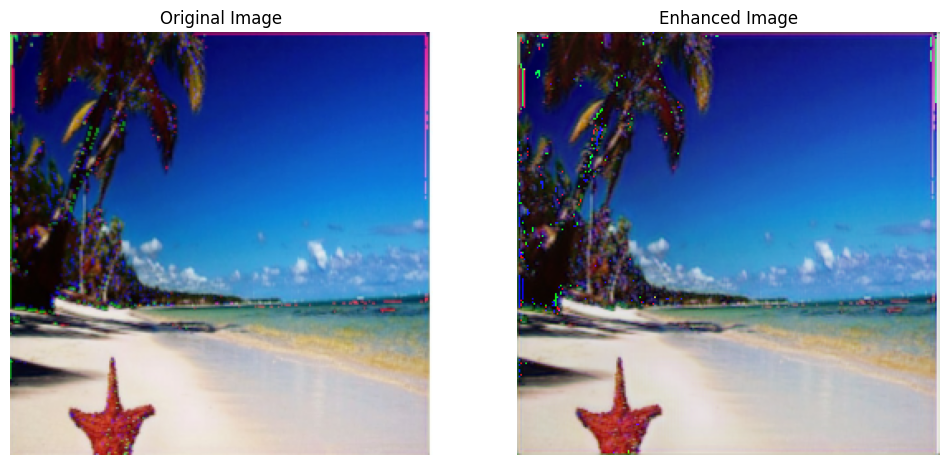

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/beach_2.jpg"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 0s 23ms/step


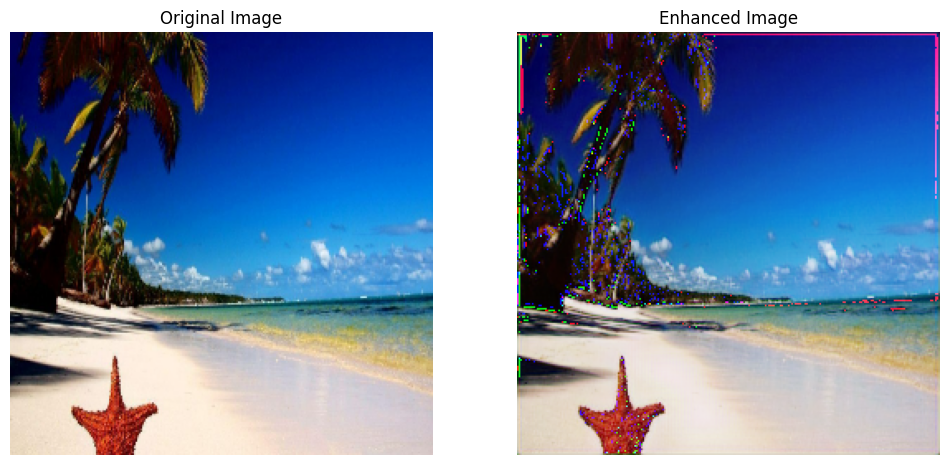

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/beach.jpg"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 0s 26ms/step


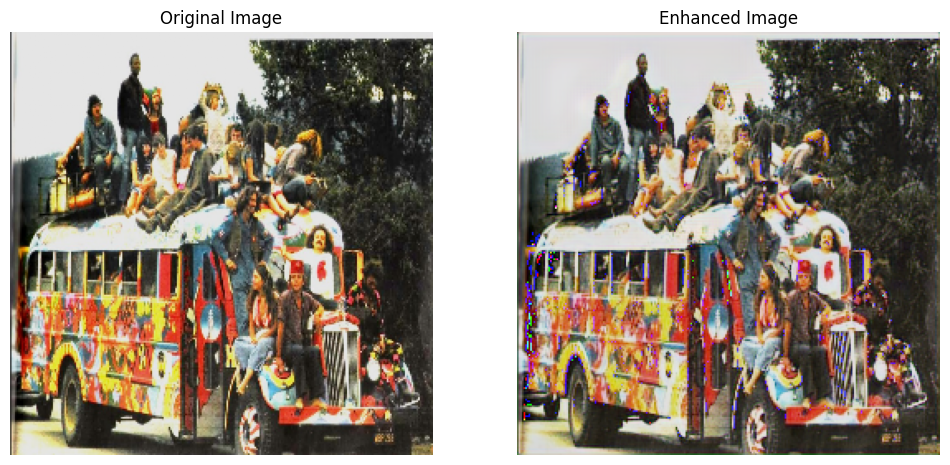

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/70s.jpg"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 0s 28ms/step


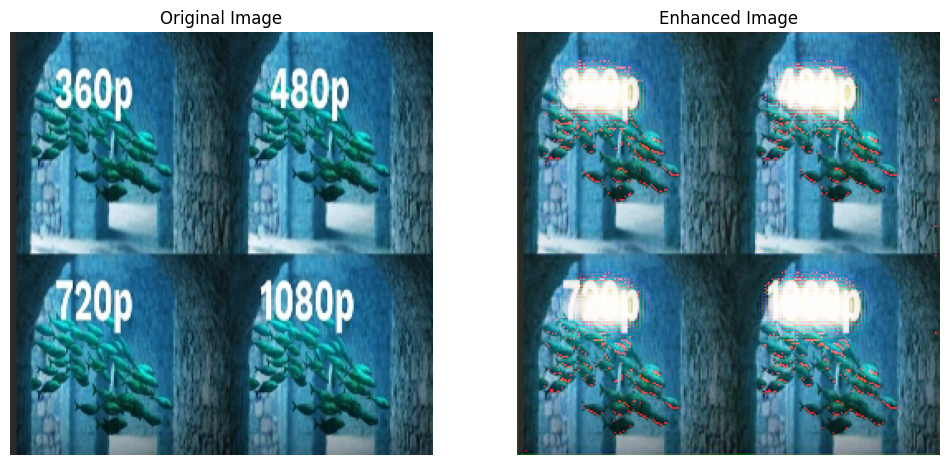

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/img.jpg"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 0s 37ms/step


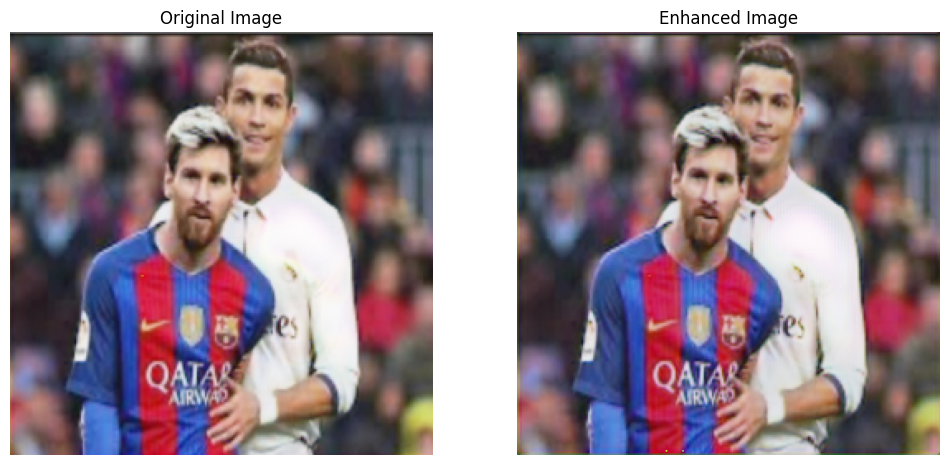

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/messi_2.jpg"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 3s 3s/step


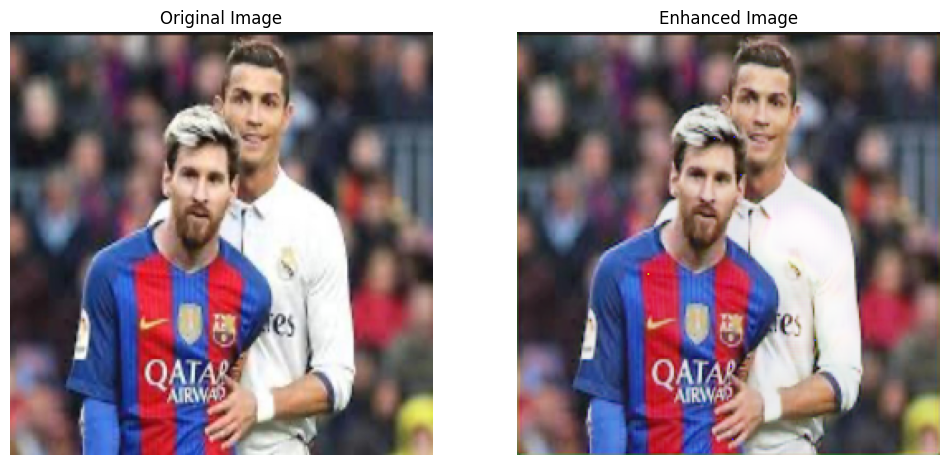

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/messi_and_ron_blur.jpg"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


#Results of previous models

Below are the results of the models which we worked on before developing the final model, these results are inferior to the results achieved with the final model.

1/1 [==============================] - 2s 2s/step


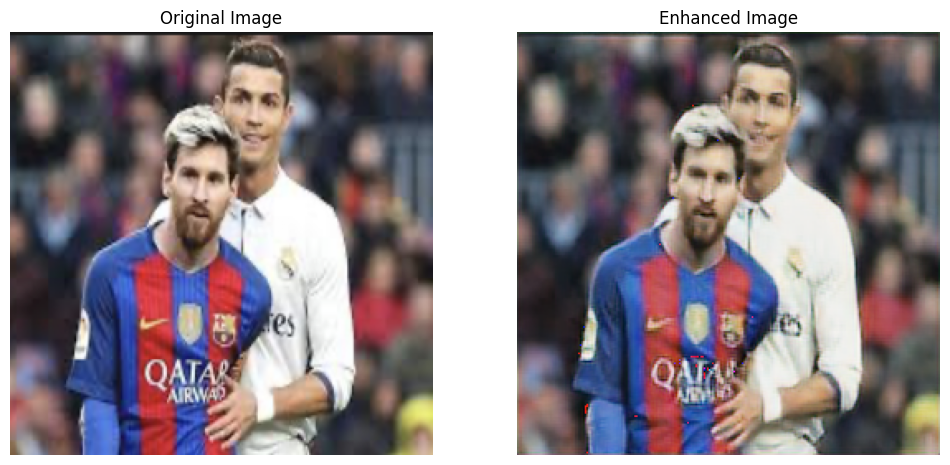

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/Messi_and_ron_blur.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 2s 2s/step


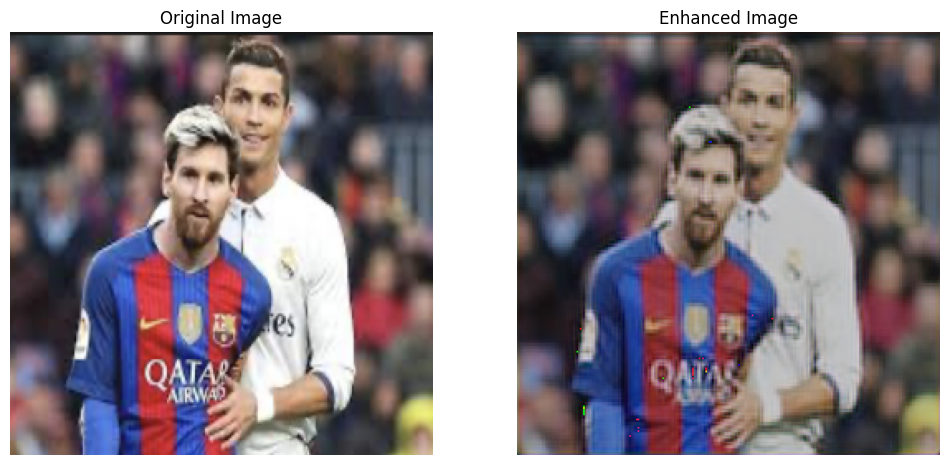

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/Messi_and_ron_blur.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 1s 681ms/step


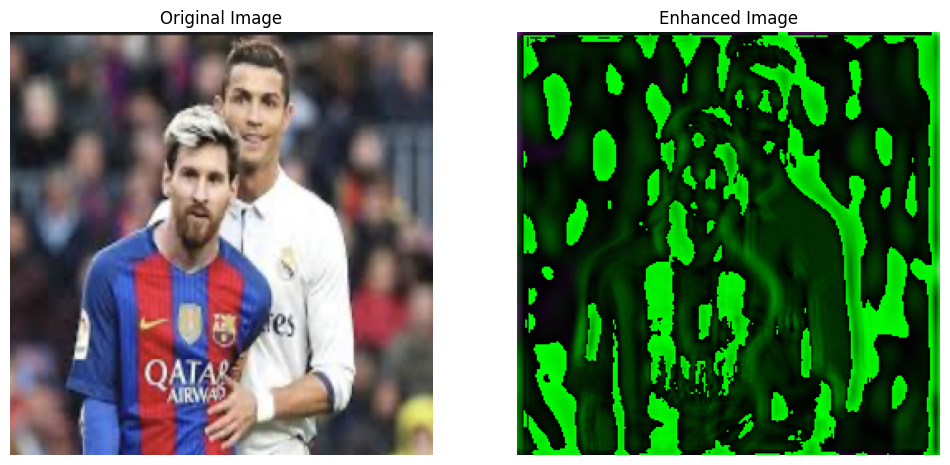

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/Messi_and_ron_blur.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 1s 772ms/step


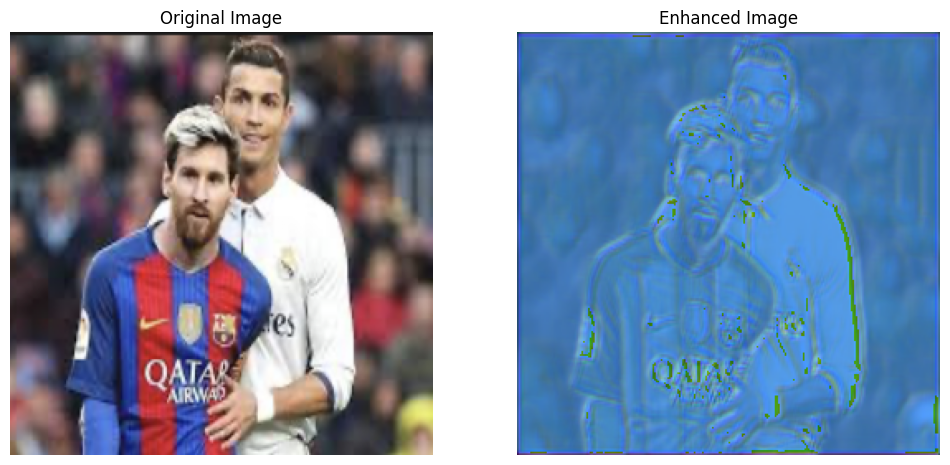

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/Messi_and_ron_blur.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 1s 717ms/step


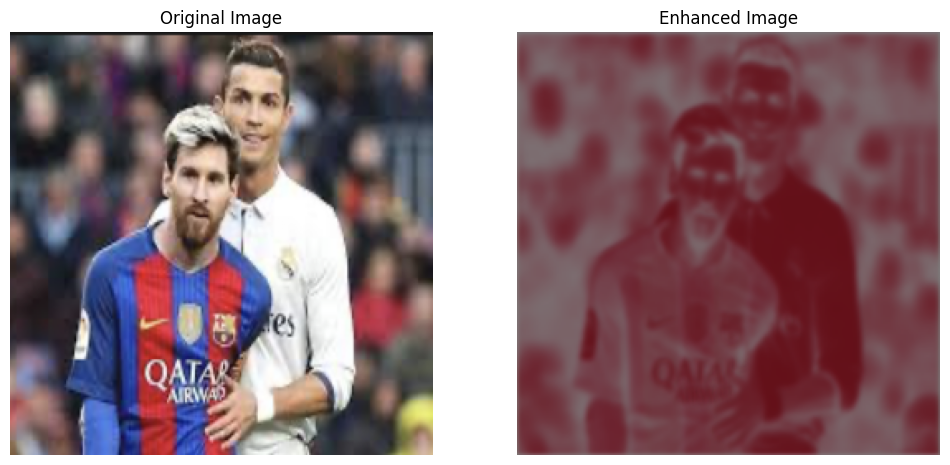

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/Messi_and_ron_blur.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 1s 551ms/step


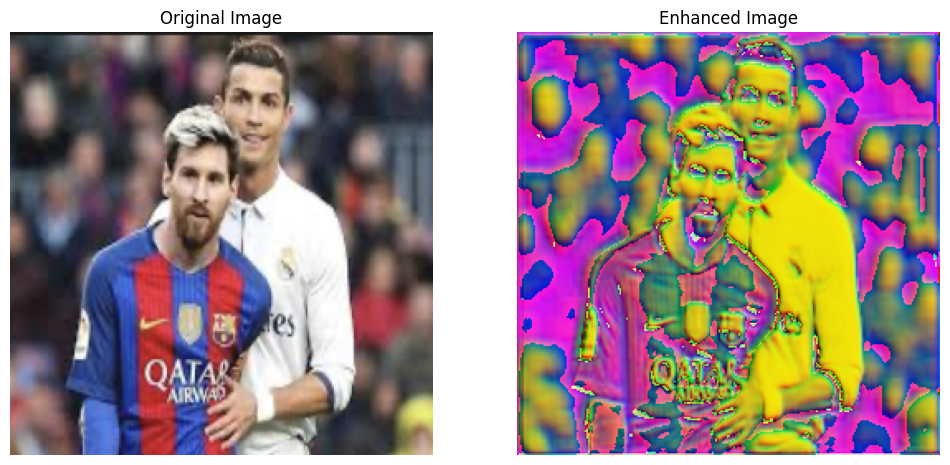

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/Messi_and_ron_blur.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


1/1 [==============================] - 0s 252ms/step


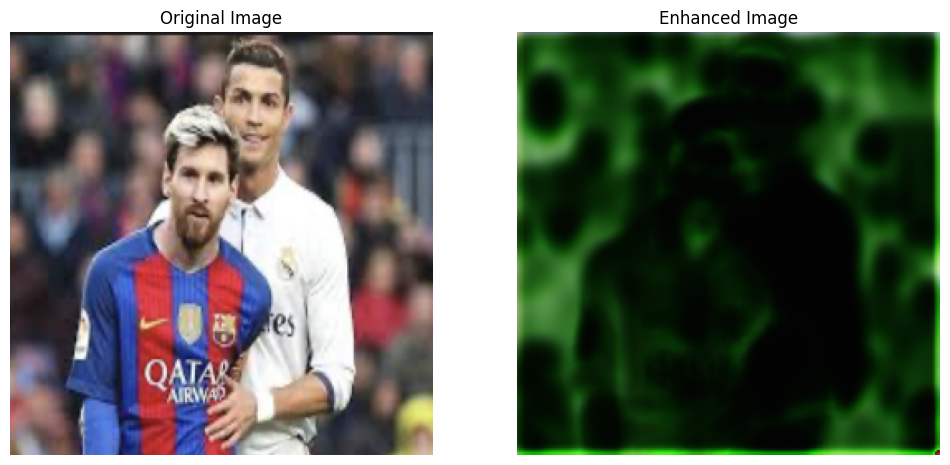

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/Messi_and_ron_blur.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()


In [ ]:
# Example changes to improve the super-resolution model

# 1. Use a deeper model architecture (e.g., SRGAN)
from keras.applications import VGG19
from keras_contrib.layers import SubPixelUpscaling
from keras_contrib.losses import DSSIMObjective

def build_srgan(input_shape=(256, 256, 3)):
    base_model = VGG19(weights="imagenet", include_top=False, input_shape=input_shape)
    base_model.trainable = False

    x = base_model.output
    x = Conv2D(64, kernel_size=3, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)
    # Add more convolutional and upsampling layers as needed
    x = Conv2D(3, kernel_size=9, padding='same')(x)
    x = SubPixelUpscaling(scale_factor=2)(x)  # Sub-pixel convolution for upscaling
    outputs = Activation('sigmoid')(x)

    srgan = Model(inputs=base_model.input, outputs=outputs)

    # Compile the SRGAN model with perceptual loss
    vgg = VGG19(weights="imagenet", include_top=False, input_shape=(256, 256, 3))
    vgg.trainable = False
    loss_fn = DSSIMObjective()
    srgan.compile(optimizer='adam', loss=loss_fn)

    return srgan

# 2. Improve training data quality and augmentation
# Augment the dataset with various transformations using ImageDataGenerator

# 3. Optimize training procedure
# Experiment with different hyperparameters and learning rate schedules

# 4. Verify preprocessing and postprocessing pipelines

# 5. Use a suitable loss function for super-resolution tasks (e.g., perceptual loss)

# 6. Evaluate using additional metrics such as PSNR or SSIM


1/1 [==============================] - 0s 27ms/step


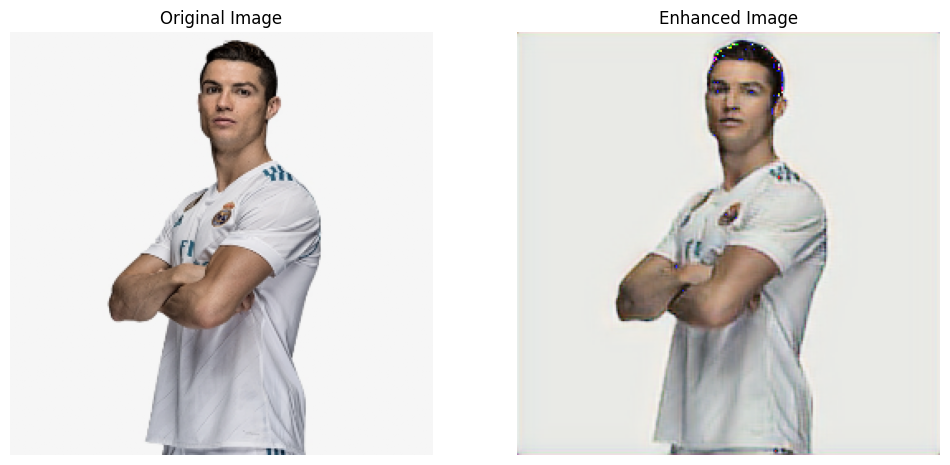

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/ron.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()

1/1 [==============================] - 0s 248ms/step


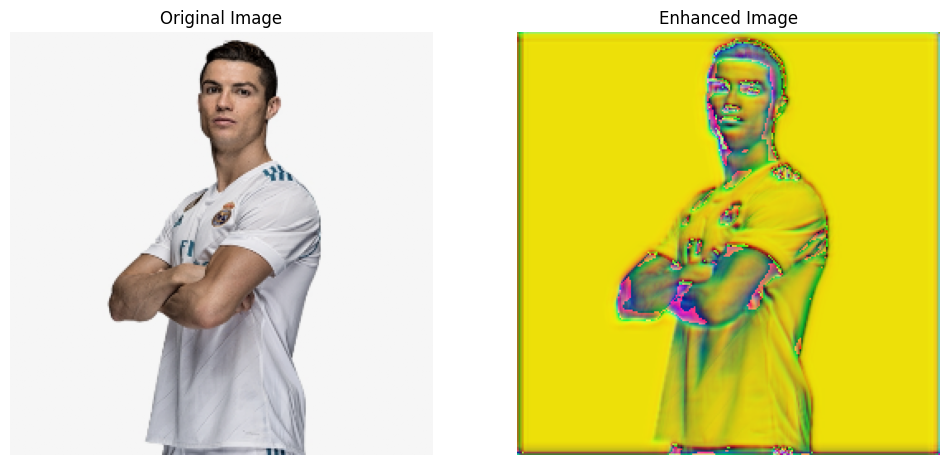

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/ron.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()

1/1 [==============================] - 0s 426ms/step


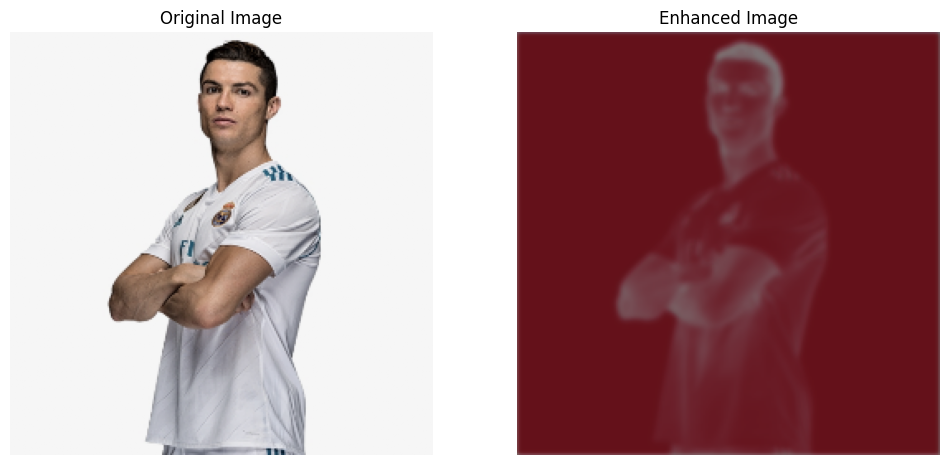

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/ron.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()

1/1 [==============================] - 0s 389ms/step


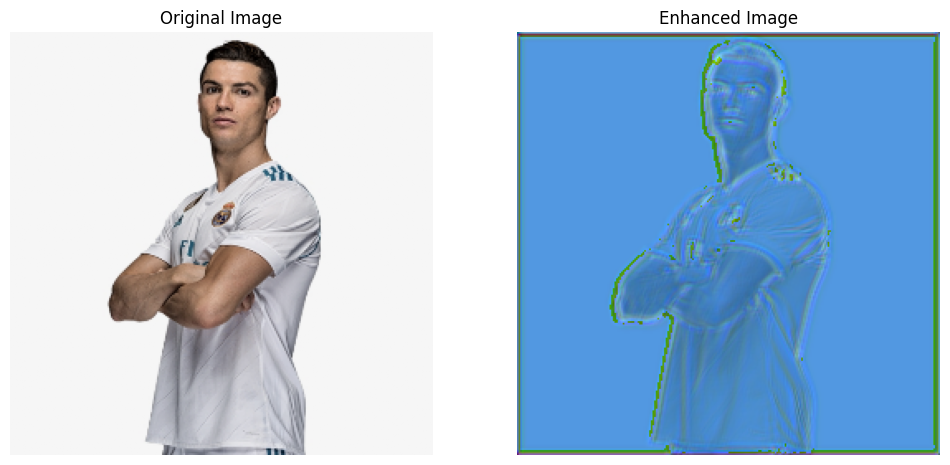

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/ron.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()

1/1 [==============================] - 0s 237ms/step


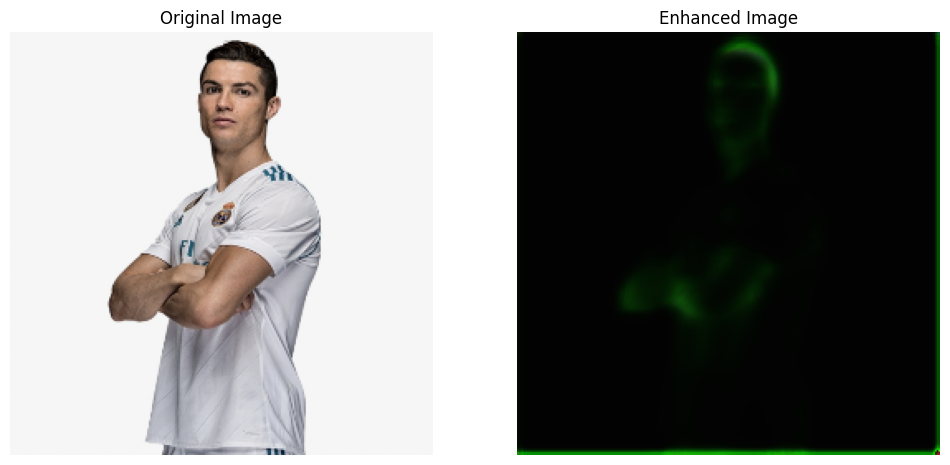

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/ron.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()

1/1 [==============================] - 0s 387ms/step


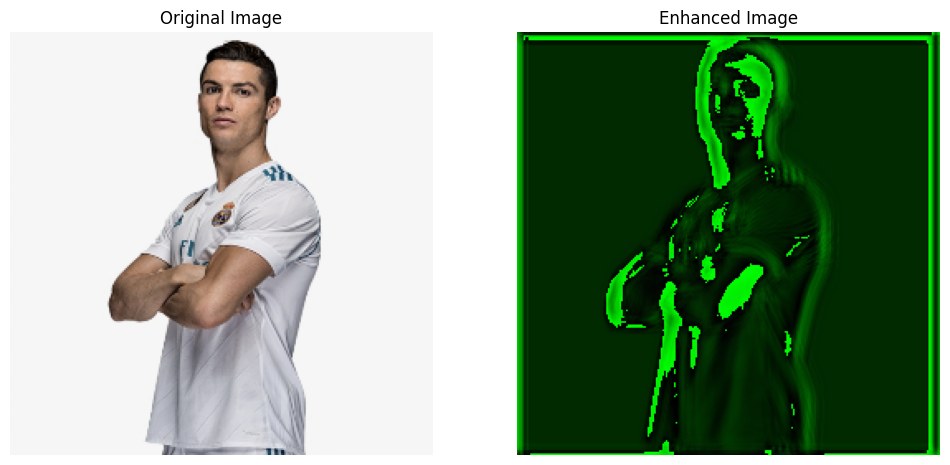

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/ron.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()

1/1 [==============================] - 1s 582ms/step


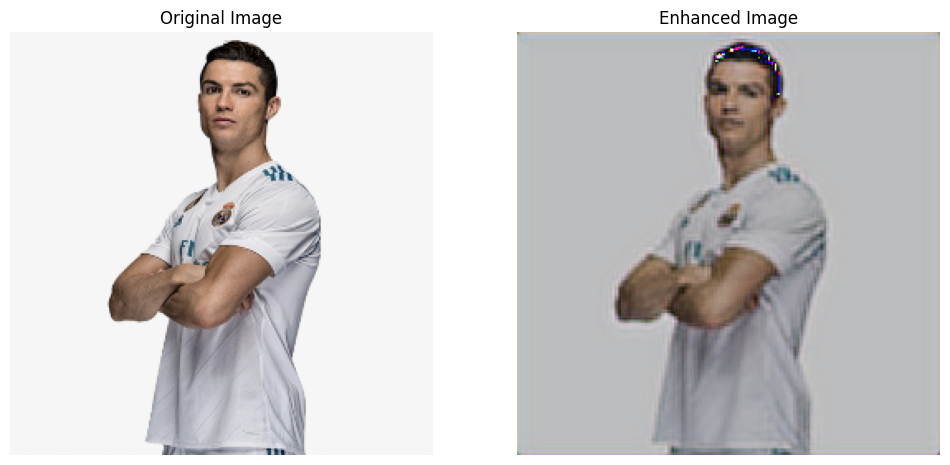

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the input image
input_image_path = "/content/ron.png"
input_image = cv2.imread(input_image_path)

# Preprocess the input image (resize and normalize)
input_image = cv2.resize(input_image, (256, 256))  # Resize to match model input size
input_image = input_image.astype(np.float32) / 255.0  # Normalize pixel values

# Expand dimensions to create a batch of size 1
input_image = np.expand_dims(input_image, axis=0)

# Generate the enhanced image using the trained SRGAN model
enhanced_image = generator.predict(input_image)

# Post-process the output image (denormalize)
enhanced_image = (enhanced_image * 255.0).astype(np.uint8)

# Display both the original and enhanced images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(cv2.cvtColor(input_image[0], cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(enhanced_image[0], cv2.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')

plt.show()